In [28]:
import torchvision
import torch
import cv2
import numpy as np
import matplotlib.pyplot as plt
from pytorch_grad_cam import GradCAM
from pytorch_grad_cam.utils.image import show_cam_on_image, preprocess_image
from typing import Callable, List, Tuple

# Load model: ViT-L/16
model = torchvision.models.vit_b_16(pretrained=True)

/home/ant/miniconda3/envs/dl/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/ant/miniconda3/envs/dl/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ViT_B_16_Weights.IMAGENET1K_V1`. You can also use `weights=ViT_B_16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [29]:
# Get the index to class mapping from path
import json
with open("ImageNet-Mini/imagenet_class_index.json") as f:
    # Load the mapping as a dictionary
    class_idx = json.load(f)

# Convert classidx to hashmap of value [0] to value [1]
class_hashmap = {}
for id, name in class_idx.values():
    class_hashmap[id] = name

In [30]:
def process_and_predict(model, image_path):
    rgb_img = cv2.imread(image_path, 1)[:, :, ::-1]
    rgb_img = cv2.resize(rgb_img, (224, 224))
    rgb_img = np.float32(rgb_img) / 255
    input_tensor = preprocess_image(rgb_img, mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])
    return model(input_tensor)

def scale_cam_image(cam, target_size=None):
    result = []
    for img in cam:
        # img = img - np.min(img)
        # img = img / (1e-7 + np.max(img))
        img = img / (1e-7 + max(np.max(img), -np.min(img)))
        if target_size is not None:
            img = cv2.resize(img, target_size)
        result.append(img)
    result = np.float32(result)

    return result

class GradCAM_with_negative(GradCAM):
    def __init__(self, model, target_layers, use_cuda=False,
                 reshape_transform=None):
        super(
            GradCAM,
            self).__init__(
            model,
            target_layers,
            use_cuda,
            reshape_transform)

    def compute_cam_per_layer(
            self,
            input_tensor: torch.Tensor,
            targets: List[torch.nn.Module],
            eigen_smooth: bool) -> np.ndarray:
        activations_list = [a.cpu().data.numpy()
                            for a in self.activations_and_grads.activations]
        grads_list = [g.cpu().data.numpy()
                      for g in self.activations_and_grads.gradients]
        target_size = self.get_target_width_height(input_tensor)

        cam_per_target_layer = []
        # Loop over the saliency image from every layer
        for i in range(len(self.target_layers)):
            target_layer = self.target_layers[i]
            layer_activations = None
            layer_grads = None
            if i < len(activations_list):
                layer_activations = activations_list[i]
            if i < len(grads_list):
                layer_grads = grads_list[i]

            cam = self.get_cam_image(input_tensor,
                                     target_layer,
                                     targets,
                                     layer_activations,
                                     layer_grads,
                                     eigen_smooth)
            # cam = np.maximum(cam, 0)
            scaled = scale_cam_image(cam, target_size)
            cam_per_target_layer.append(scaled[:, None, :])

        return cam_per_target_layer
    
    def aggregate_multi_layers(
            self,
            cam_per_target_layer: np.ndarray) -> np.ndarray:
        cam_per_target_layer = np.concatenate(cam_per_target_layer, axis=1)
        # cam_per_target_layer = np.maximum(cam_per_target_layer, 0)
        result = np.mean(cam_per_target_layer, axis=1)
        return scale_cam_image(result)

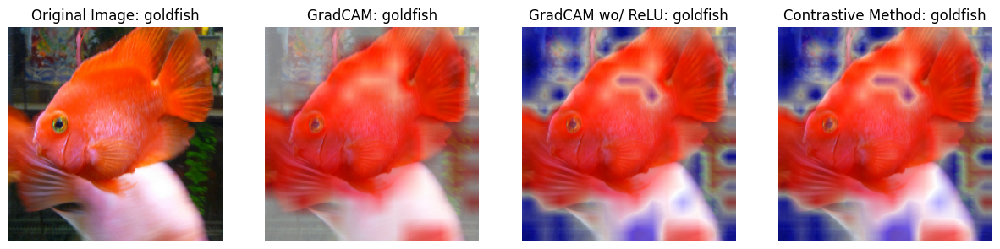

done


In [31]:
import matplotlib.pyplot as plt
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget, ClassifierOutputSoftmaxTarget

def apply_cam(model, target_layers, image_path, target, class_idx=class_idx, use_cuda=False, 
                       aug_smooth=False, eigen_smooth=False, verbose=True, save=False):
    """
    Apply CAM method to a given model and image and plot the results.
    
    :param model: PyTorch model to apply CAM method.
    :param target_layers: Layers of the model to target for CAM.
    :param image_path: Path to the input image.
    :param target: Target class index.
    :param class_idx: Dictionary mapping class indices to class names.
    :param method: CAM method to use (default is 'gradcam').
    :param use_cuda: Boolean indicating whether to use CUDA.
    :param aug_smooth: Apply test time augmentation to smooth the CAM (default False).
    :param eigen_smooth: Apply eigen smoothing (default False).
    :return: None, displays the plot with original and CAM images.
    """

    methods = {
        "gradcam": GradCAM,
        "gradcam_with_negative": GradCAM_with_negative
    }
    
    use_cuda = use_cuda and torch.cuda.is_available()
    if use_cuda:
        model = model.cuda()

    def reshape_transform(tensor, height=14, width=14):
        result = tensor[:, 1:, :].reshape(tensor.size(0), height, width, tensor.size(2))
        result = result.transpose(2, 3).transpose(1, 2)
        return result

    cam_constructor = methods['gradcam_with_negative']
    cam_args = {
        "model": model,
        "target_layers": target_layers,
        "use_cuda": use_cuda,
        "reshape_transform": reshape_transform
    }

    # Initialize cam
    st_cam = methods['gradcam'](**cam_args)
    cam = cam_constructor(**cam_args)

    # Load and preprocess the image
    rgb_img = cv2.imread(image_path, 1)[:, :, ::-1]
    rgb_img = cv2.resize(rgb_img, (224, 224))
    rgb_img = np.float32(rgb_img) / 255
    input_tensor = preprocess_image(rgb_img, mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])

    # Create the CAM images
    standard_cam_w_relu = st_cam(input_tensor=input_tensor, targets=[ClassifierOutputTarget(target)], eigen_smooth=eigen_smooth, aug_smooth=aug_smooth)
    standard_cam = cam(input_tensor=input_tensor, targets=[ClassifierOutputTarget(target)], eigen_smooth=eigen_smooth, aug_smooth=aug_smooth)
    contrastive_cam = cam(input_tensor=input_tensor, targets=[ClassifierOutputSoftmaxTarget(target)], eigen_smooth=eigen_smooth, aug_smooth=aug_smooth)
    standard_cam_image = show_cam_on_image(rgb_img, standard_cam[0,:])
    contrastive_cam_image = show_cam_on_image(rgb_img, contrastive_cam[0,:])

    if verbose:
        # Plotting
        plt.figure(figsize=(15, 5))
        plt.subplot(1, 4, 1)
        plt.imshow(rgb_img)
        plt.title(f"Original Image: {class_hashmap[image_path.split('/')[-2]]}")
        plt.axis('off')

        import matplotlib.colors as colors

        plt.subplot(1, 4, 2)
        plt.imshow(rgb_img)
        plt.imshow(standard_cam_w_relu[0,:], cmap='seismic', alpha=0.5, norm=colors.CenteredNorm(0))
        plt.title(f"GradCAM: {class_idx[str(target)][1]}")
        plt.axis('off')


        plt.subplot(1, 4, 3)
        plt.imshow(rgb_img)
        plt.imshow(standard_cam[0,:], cmap='seismic', alpha=0.5, norm=colors.CenteredNorm(0))
        plt.title(f"GradCAM wo/ ReLU: {class_idx[str(target)][1]}")
        plt.axis('off')

        plt.subplot(1, 4, 4)
        plt.imshow(rgb_img)
        plt.imshow(contrastive_cam[0,:], cmap='seismic', alpha=0.5, norm=colors.CenteredNorm(0))
        plt.title(f"Contrastive Method: {class_idx[str(target)][1]}")
        plt.axis('off')

        plt.show()

    if save:
        # Save individual images without borders
        # Original image
        plt.imshow(rgb_img)
        plt.axis('off')
        plt.savefig('report_figures/original.jpg', bbox_inches='tight', pad_inches=0)

        # Standard GradCAM
        plt.imshow(rgb_img)
        plt.imshow(standard_cam[0,:], cmap='seismic', alpha=0.5, norm=colors.CenteredNorm(0))
        plt.axis('off')
        plt.savefig('report_figures/standard_cam.jpg', bbox_inches='tight', pad_inches=0)

        # Contrastive GradCAM
        plt.imshow(rgb_img)
        plt.imshow(contrastive_cam[0,:], cmap='seismic', alpha=0.5, norm=colors.CenteredNorm(0))
        plt.axis('off')
        plt.savefig('report_figures/contrastive_cam.jpg', bbox_inches='tight', pad_inches=0)

        # Standard GradCAM with ReLU
        plt.imshow(rgb_img)
        plt.imshow(standard_cam_w_relu[0,:], cmap='seismic', alpha=0.5, norm=colors.CenteredNorm(0))
        plt.axis('off')
        plt.savefig('report_figures/standard_cam_w_relu.jpg', bbox_inches='tight', pad_inches=0)



    return standard_cam_image, contrastive_cam_image, standard_cam, contrastive_cam



apply_cam(model, target_layers=[model.encoder.layers[-5].ln_1], image_path="ImageNet-Mini/images/n01443537/ILSVRC2012_val_00000994.JPEG", target=1, class_idx=class_idx)

Layer: 0, Target: 826, Class: stopwatch, P=0.32297977805137634


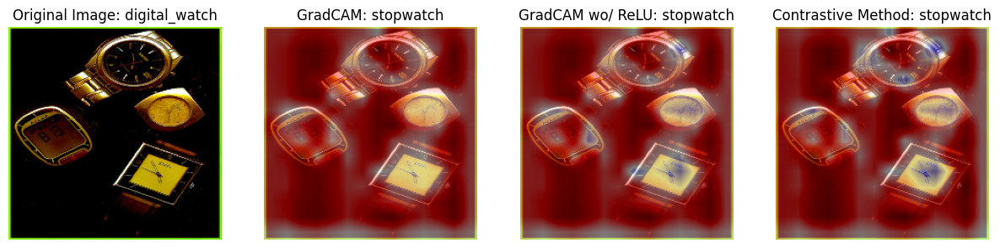

Layer: 0, Target: 531, Class: digital_watch, P=0.32114461064338684


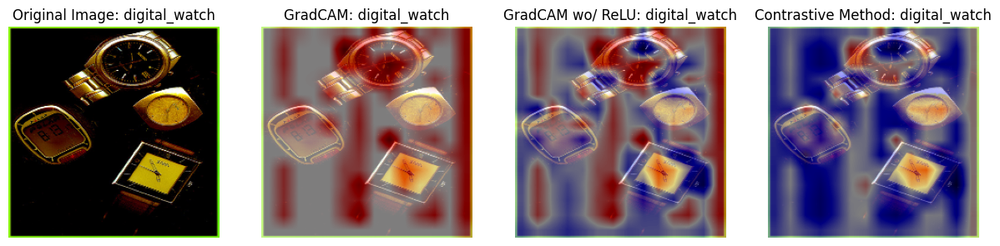

Layer: 1, Target: 826, Class: stopwatch, P=0.32297977805137634


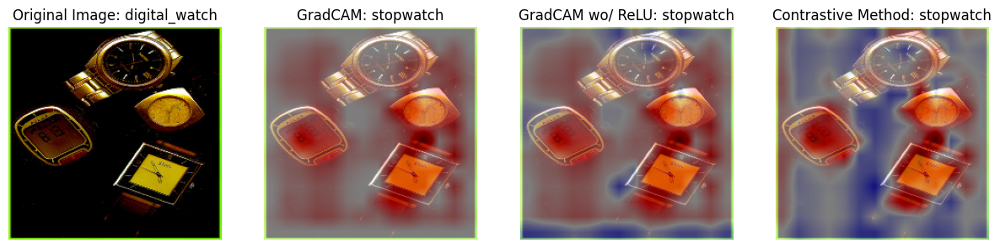

Layer: 1, Target: 531, Class: digital_watch, P=0.32114461064338684


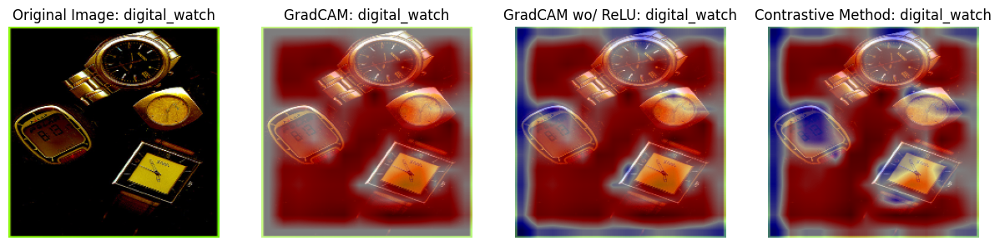

Layer: 2, Target: 826, Class: stopwatch, P=0.32297977805137634


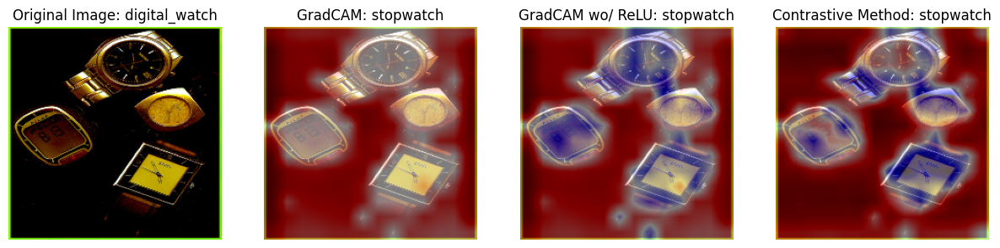

Layer: 2, Target: 531, Class: digital_watch, P=0.32114461064338684


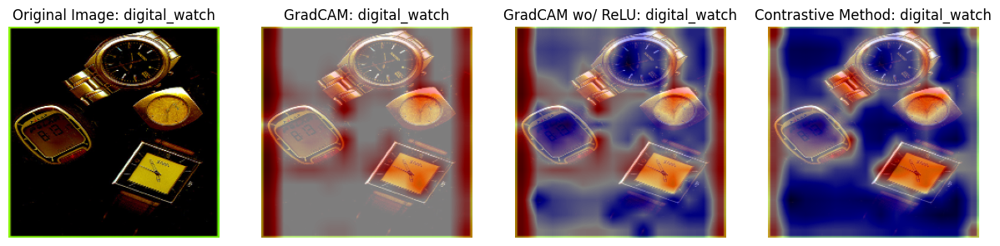

Layer: 3, Target: 826, Class: stopwatch, P=0.32297977805137634


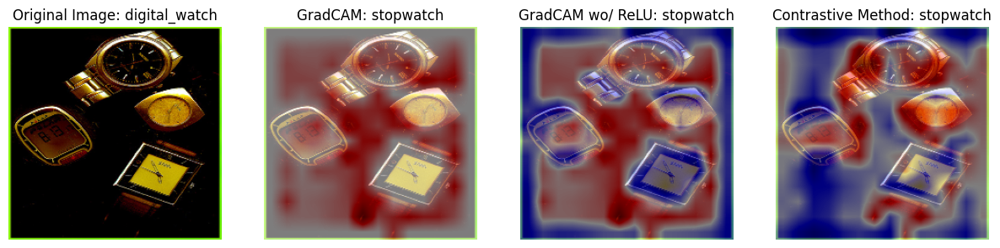

Layer: 3, Target: 531, Class: digital_watch, P=0.32114461064338684


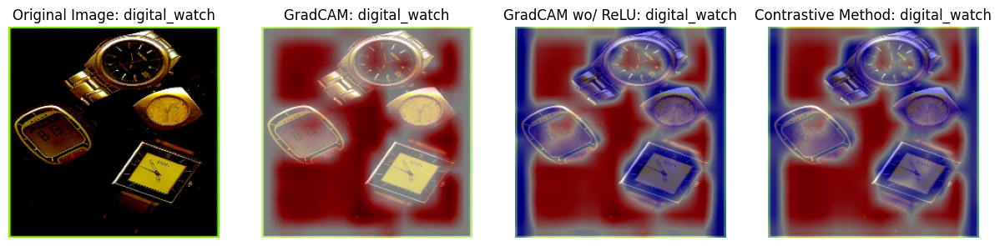

Layer: 4, Target: 826, Class: stopwatch, P=0.32297977805137634


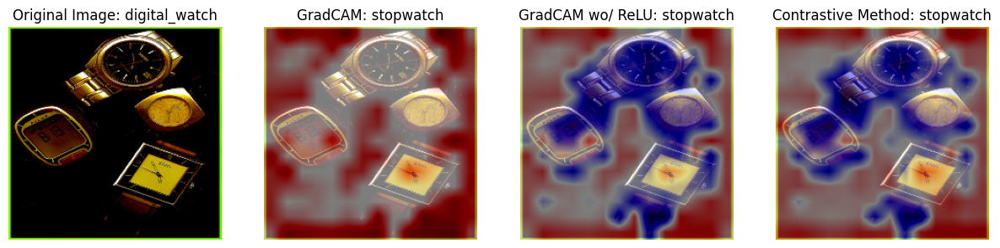

Layer: 4, Target: 531, Class: digital_watch, P=0.32114461064338684


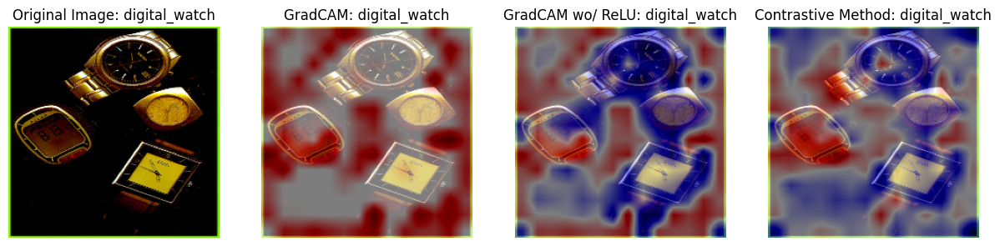

Layer: 5, Target: 826, Class: stopwatch, P=0.32297977805137634


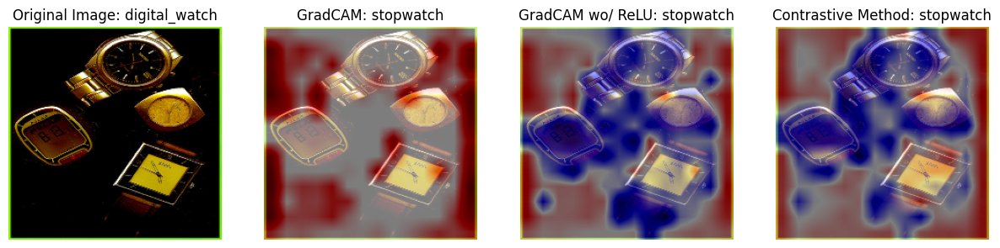

Layer: 5, Target: 531, Class: digital_watch, P=0.32114461064338684


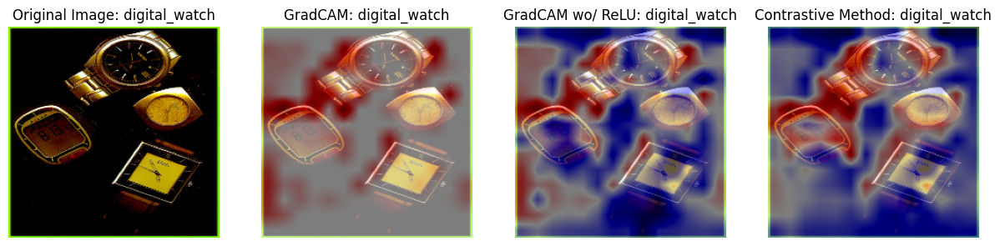

Layer: 6, Target: 826, Class: stopwatch, P=0.32297977805137634


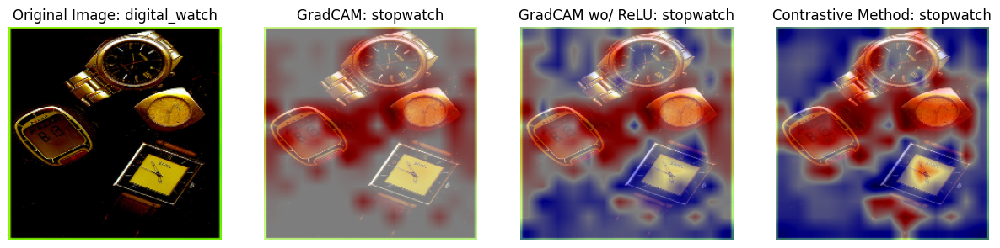

Layer: 6, Target: 531, Class: digital_watch, P=0.32114461064338684


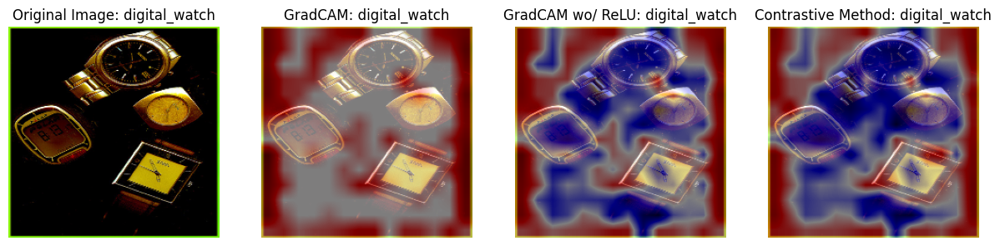

Layer: 7, Target: 826, Class: stopwatch, P=0.32297977805137634


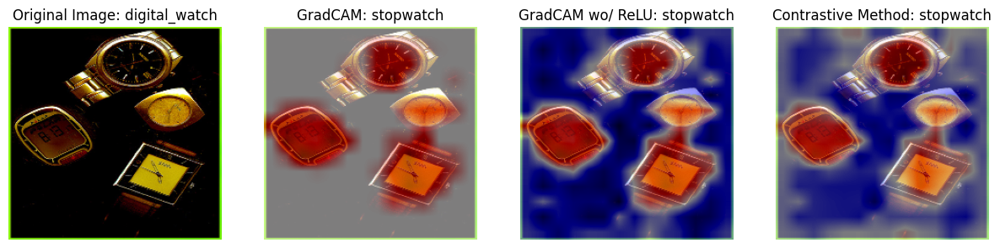

Layer: 7, Target: 531, Class: digital_watch, P=0.32114461064338684


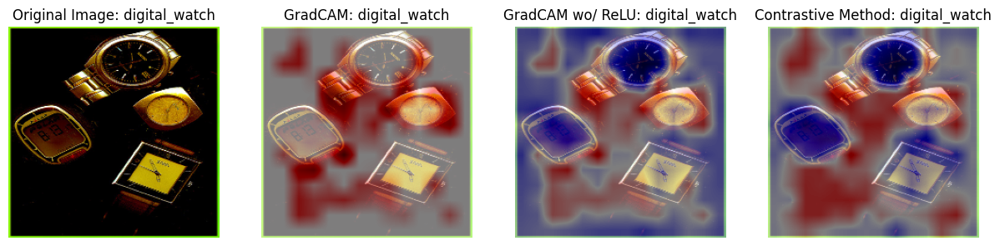

Layer: 8, Target: 826, Class: stopwatch, P=0.32297977805137634


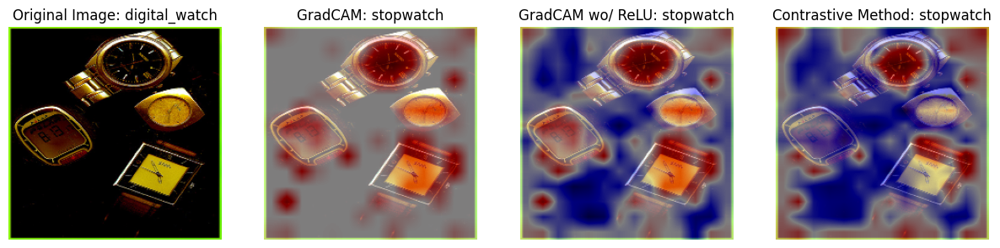

Layer: 8, Target: 531, Class: digital_watch, P=0.32114461064338684


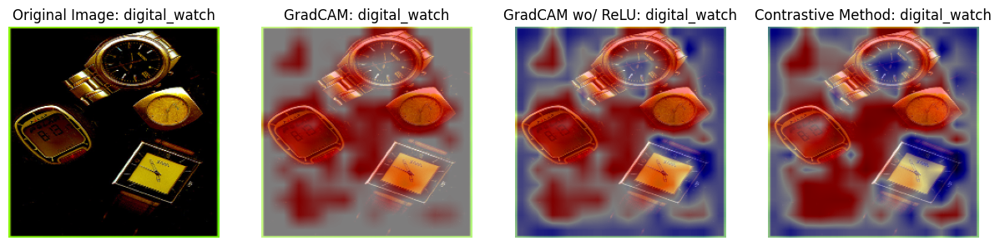

Layer: 9, Target: 826, Class: stopwatch, P=0.32297977805137634


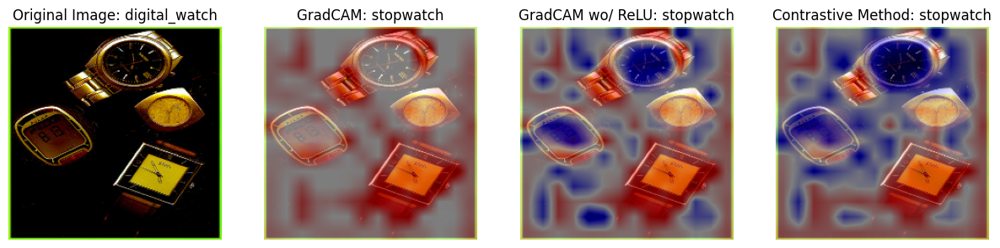

Layer: 9, Target: 531, Class: digital_watch, P=0.32114461064338684


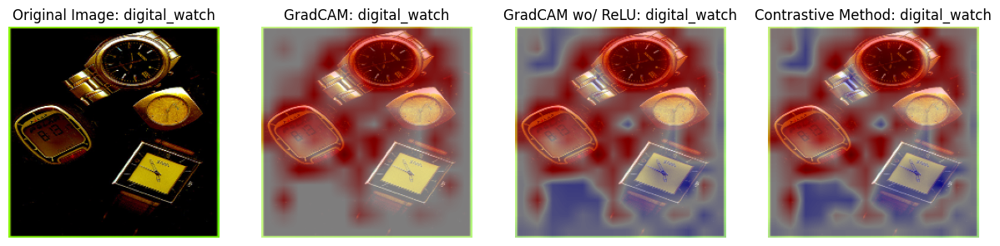

Layer: 10, Target: 826, Class: stopwatch, P=0.32297977805137634


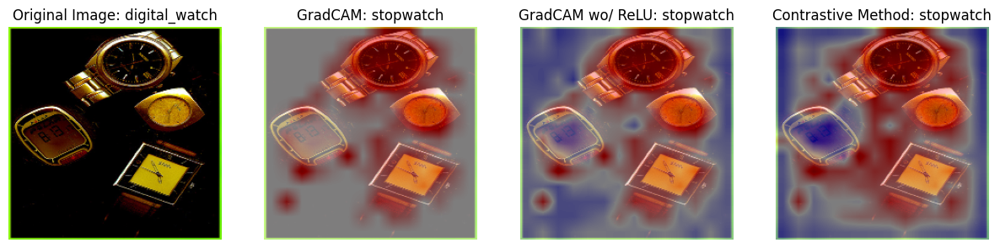

Layer: 10, Target: 531, Class: digital_watch, P=0.32114461064338684


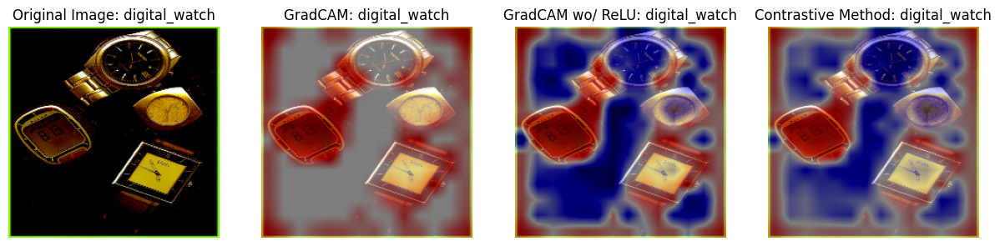

Layer: 11, Target: 826, Class: stopwatch, P=0.32297977805137634


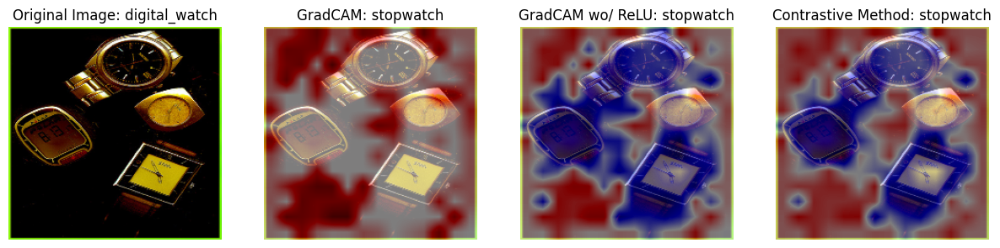

Layer: 11, Target: 531, Class: digital_watch, P=0.32114461064338684


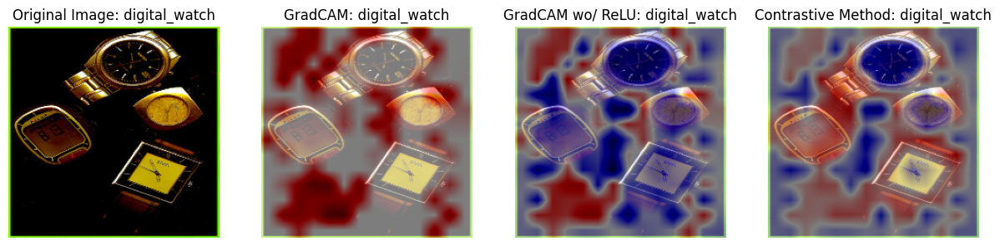

In [60]:
image_path = "ImageNet-Mini/images/n03197337/ILSVRC2012_val_00003455.JPEG"
l_range = range(0, 12)
k = 2 #

# using torch find arg of topk for image
topk_vals, topk_ind = torch.topk(torch.softmax(process_and_predict(model, image_path), dim=-1), k)
topk_vals, topk_ind = topk_vals[0].detach().numpy(), topk_ind[0].numpy()


for l in l_range:
    for t, v in zip(topk_ind, topk_vals):
        print(f'Layer: {l}, Target: {t}, Class: {class_idx[str(t)][1]}, P={v}')
        apply_cam(model, target_layers=[model.encoder.layers[l].ln_1], image_path=image_path, target=t, class_idx=class_idx)